In [1]:
!nvidia-smi

Mon Dec  4 13:15:21 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.105.17   Driver Version: 525.105.17   CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   49C    P8    10W /  70W |      0MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [2]:
!pip install -Uqqq pip --progress-bar off
!pip install -qqq torch==2.1.1 --progress-bar off
!pip install -qqq diffusers==0.24.0 --progress-bar off
!pip install -qqq transformers==4.35.2 --progress-bar off
!pip install -qqq accelerate==0.24.1 --progress-bar off

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
torchaudio 2.1.0+cu118 requires torch==2.1.0, but you have torch 2.1.1 which is incompatible.
torchdata 0.7.0 requires torch==2.1.0, but you have torch 2.1.1 which is incompatible.
torchtext 0.16.0 requires torch==2.1.0, but you have torch 2.1.1 which is incompatible.
torchvision 0.16.0+cu118 requires torch==2.1.0, but you have torch 2.1.1 which is incompatible.


In [3]:
import torch
from diffusers import AutoPipelineForText2Image

image_generator = AutoPipelineForText2Image.from_pretrained(
    "stabilityai/sdxl-turbo", torch_dtype=torch.float16, variant="fp16"
).to("cuda")

The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

model_index.json:   0%|          | 0.00/685 [00:00<?, ?B/s]

Fetching 18 files:   0%|          | 0/18 [00:00<?, ?it/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/704 [00:00<?, ?B/s]

text_encoder_2/config.json:   0%|          | 0.00/575 [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/459 [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/586 [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/565 [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

tokenizer_2/special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

tokenizer_2/tokenizer_config.json:   0%|          | 0.00/855 [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/1.78k [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/607 [00:00<?, ?B/s]

model.fp16.safetensors:   0%|          | 0.00/1.39G [00:00<?, ?B/s]

tokenizer_2/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

model.fp16.safetensors:   0%|          | 0.00/246M [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/5.14G [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/167M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

In [4]:
import os

import cv2
from PIL import Image, ImageDraw, ImageFont

font_path = os.path.join(cv2.__path__[0], "qt", "fonts", "DejaVuSans.ttf")
font = ImageFont.truetype(font_path, size=28)

In [5]:
%%time

generator = torch.Generator(device="cuda").manual_seed(42)

prompt = """
Depict a beautiful snowy landscape with a large, transparent glass bottle as the central focus.
Inside the bottle, place a cute llama, creating a whimsical, surreal effect.
The background should feature a breathtaking, high-dynamic-range (HDR) sunrise,
illuminating the snowy scenery and enhancing the magical atmosphere.
""".strip()

outputs = image_generator(
    prompt=prompt, num_inference_steps=1, guidance_scale=0, generator=generator
)

  0%|          | 0/1 [00:00<?, ?it/s]

CPU times: user 1.91 s, sys: 303 ms, total: 2.22 s
Wall time: 3.99 s


In [6]:
outputs.keys(), len(outputs.images)

(odict_keys(['images']), 1)

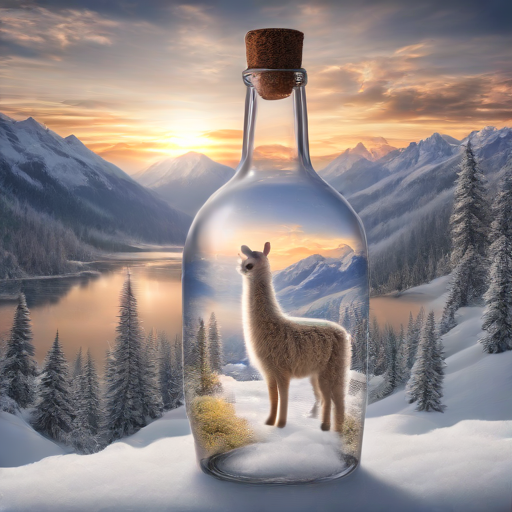

In [7]:
outputs.images[0]

In [8]:
images = []
for steps in range(1, 7):
    generator = torch.Generator(device="cuda").manual_seed(42)

    prompt = """
    Depict a beautiful snowy landscape with a large, transparent glass bottle as the central focus.
    Inside the bottle, place a cute llama, creating a whimsical, surreal effect.
    The background should feature a breathtaking, high-dynamic-range (HDR) sunrise,
    illuminating the snowy scenery and enhancing the magical atmosphere.
    """.strip()

    outputs = image_generator(
        prompt=prompt, num_inference_steps=steps, guidance_scale=0, generator=generator
    )
    images.append(outputs.images[0])

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

In [9]:
def display_image_grid(images, titles, grid_width, font, image_spacing=10):
    if len(images) != len(titles):
        raise ValueError("Number of images and titles must be the same")

    img_width, img_height = images[0].size

    n = len(images)
    grid_height = n // grid_width + (n % grid_width > 0)

    total_width = img_width * grid_width + image_spacing * (grid_width - 1)
    total_height = img_height * grid_height + image_spacing * (grid_height - 1)

    grid_image = Image.new("RGB", (total_width, total_height), (255, 255, 255))

    for i, (image, title) in enumerate(zip(images, titles)):
        row = i // grid_width
        col = i % grid_width
        x = col * (img_width + image_spacing)
        y = row * (img_height + image_spacing)

        draw = ImageDraw.Draw(image)
        text_bbox = draw.textbbox((0, 0), title, font=font)
        text_width = text_bbox[2] - text_bbox[0]
        text_height = text_bbox[3] - text_bbox[1]
        text_x = (img_width - text_width) // 2
        text_y = 0
        draw.text((text_x, text_y), title, font=font, fill=(255, 255, 255))

        grid_image.paste(image, (x, y))

    return grid_image

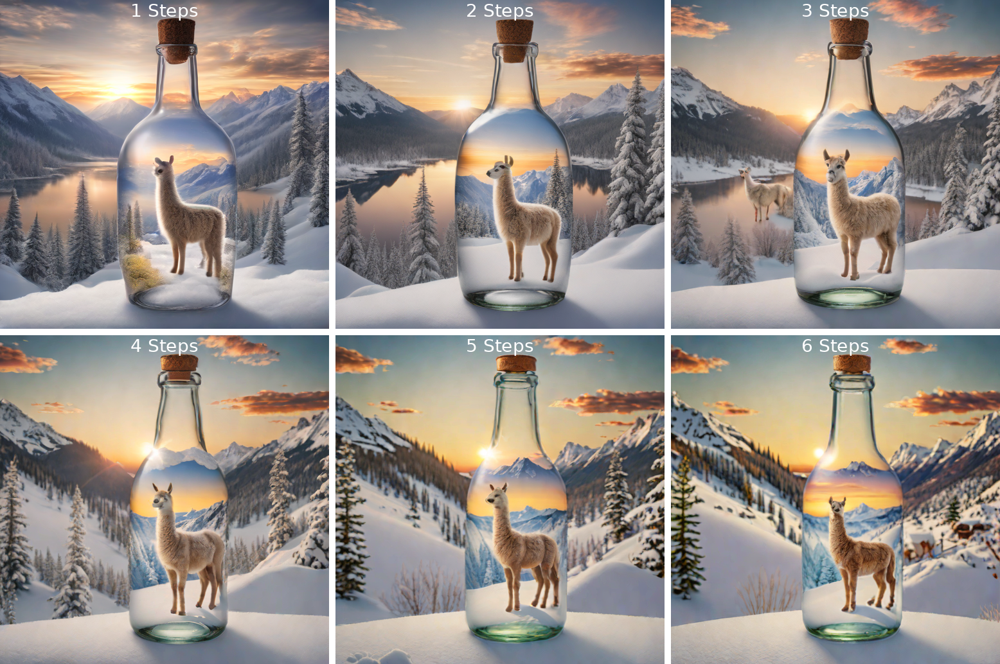

In [10]:
display_image_grid(
    images, titles=[f"{steps} Steps" for steps in range(1, 7)], grid_width=3, font=font
)

In [11]:
images = []
for scale in range(6):
    generator = torch.Generator(device="cuda").manual_seed(42)

    prompt = """
    Depict a beautiful snowy landscape with a large, transparent glass bottle as the central focus.
    Inside the bottle, place a cute llama, creating a whimsical, surreal effect.
    The background should feature a breathtaking, high-dynamic-range (HDR) sunrise,
    illuminating the snowy scenery and enhancing the magical atmosphere.
    """.strip()

    outputs = image_generator(
        prompt=prompt,
        num_inference_steps=2,
        guidance_scale=float(scale),
        generator=generator,
    )
    images.append(outputs.images[0])

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

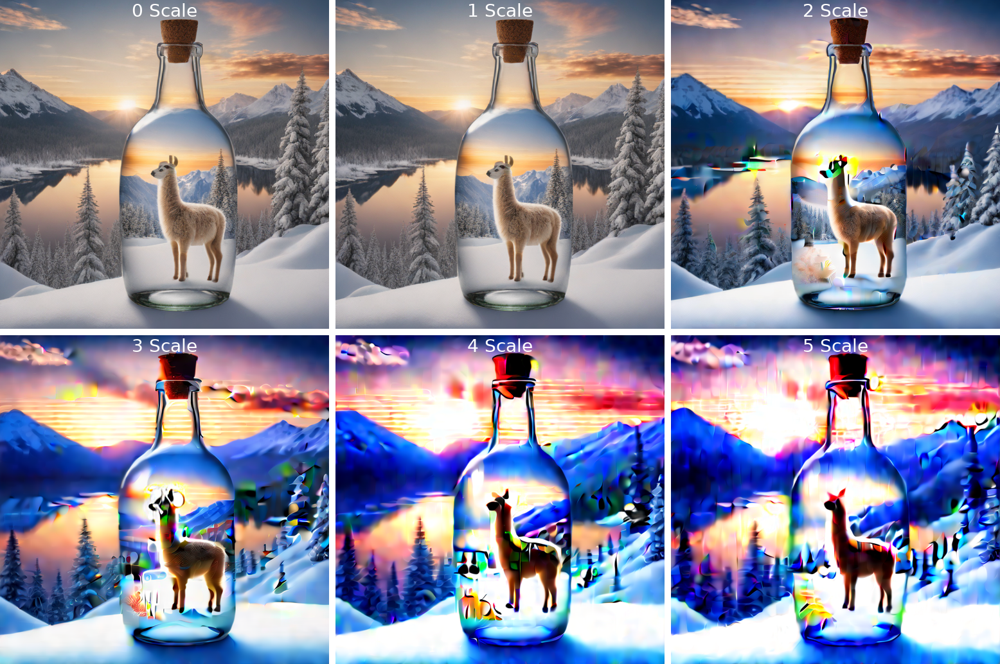

In [12]:
display_image_grid(
    images, titles=[f"{scale} Scale" for scale in range(6)], grid_width=3, font=font
)

In [13]:
import torch


def generate_image(
    prompt, inference_steps: int = 2, guidance_scale: float = 0.0, seed: int = 42
):
    generator = torch.Generator(device="cuda").manual_seed(seed)
    outputs = image_generator(
        prompt=prompt,
        num_inference_steps=inference_steps,
        guidance_scale=guidance_scale,
        generator=generator,
    )

    return outputs.images[0]

## Animals and Wildlife

  0%|          | 0/4 [00:00<?, ?it/s]

CPU times: user 1.04 s, sys: 2.73 ms, total: 1.04 s
Wall time: 1.09 s


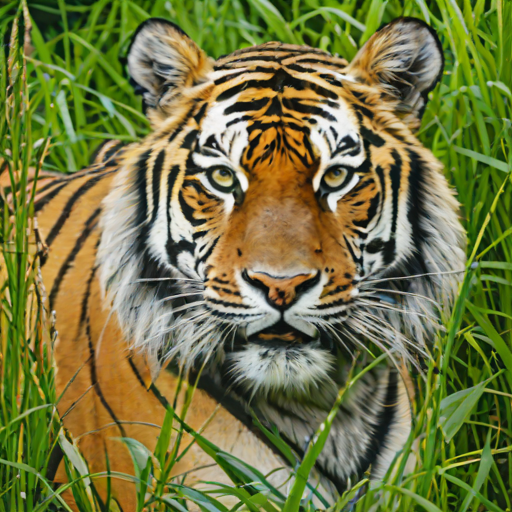

In [14]:
%%time
prompt = """
A hyper-realistic photograph of a majestic tiger, with striking blue eyes, moving gracefully through a field of tall grass.
The image captures the powerful essence and detailed fur texture of the tiger, set against the lush greenery of the grass.
""".strip()

generate_image(prompt, inference_steps=4)

  0%|          | 0/2 [00:00<?, ?it/s]

CPU times: user 756 ms, sys: 499 µs, total: 757 ms
Wall time: 779 ms


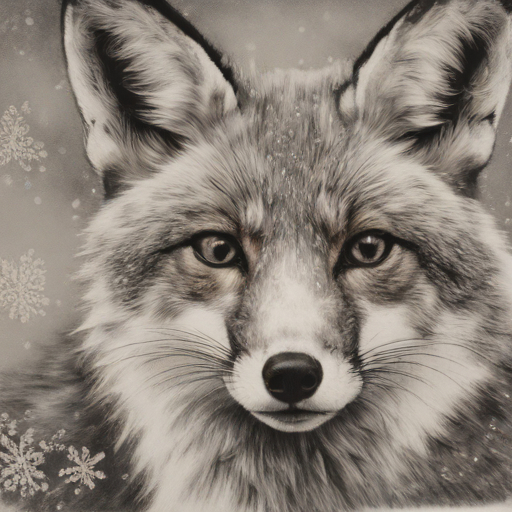

In [15]:
%%time
prompt = """
Generate a detailed charcoal drawing of a close-up portrait of a curious fox,
featuring snowflakes delicately resting on its fur, capturing the texture and
depth characteristic of charcoal art.
""".strip()

generate_image(prompt, inference_steps=2)

## Nature

  0%|          | 0/4 [00:00<?, ?it/s]

CPU times: user 1 s, sys: 14.3 ms, total: 1.02 s
Wall time: 1.08 s


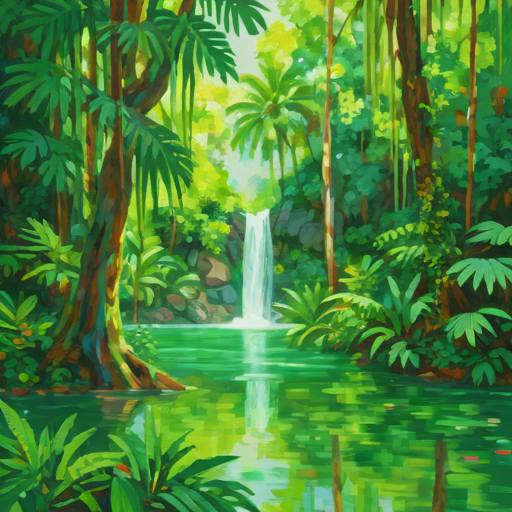

In [16]:
%%time

prompt = """
A peaceful and tranquil waterfall cascading down in a dense, vibrant tropical forest.
The forest is illuminated by gentle sunlight that filters through the thick canopy of green leaves,
creating a play of light and shadow on the forest floor and the water's surface.
The entire scene is depicted in an impressionistic style, reminiscent of Claude Monet's technique.
""".strip()

generate_image(prompt, inference_steps=4)

  0%|          | 0/4 [00:00<?, ?it/s]

CPU times: user 1.02 s, sys: 16.5 ms, total: 1.03 s
Wall time: 1.06 s


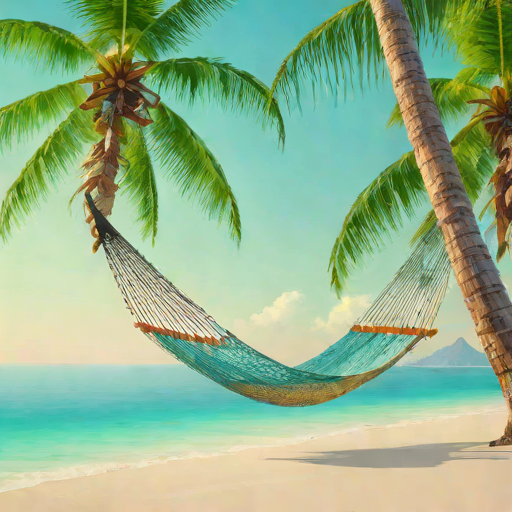

In [17]:
%%time

prompt = """
A serene beach landscape featuring a hammock strung between two palm trees,
facing a pristine, crystal-clear ocean. The scene should be rendered in a
vivid watercolor style, emphasizing soft and fluid color transitions,
capturing the essence of tranquility and natural beauty.
""".strip()

generate_image(prompt, inference_steps=4)

## Fantasy

  0%|          | 0/6 [00:00<?, ?it/s]

CPU times: user 1.3 s, sys: 60 ms, total: 1.36 s
Wall time: 1.44 s


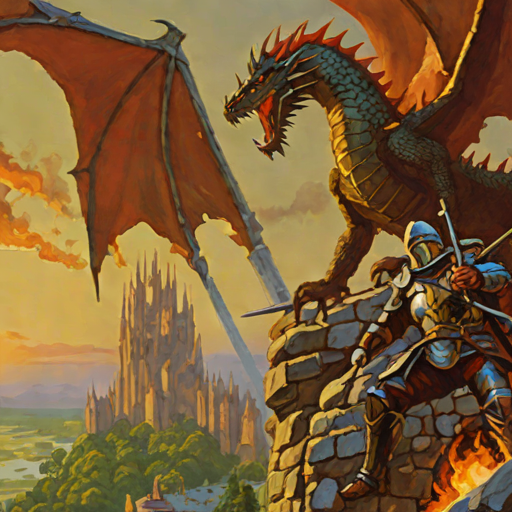

In [76]:
%%time

prompt = """
A dramatic scene atop a medieval castle tower: a knight in gleaming armor
battles a fierce, fire-breathing dragon. Emulate Frank Frazetta's dynamic,
vibrant style, highlighting the epic fantasy of the confrontation.
""".strip()

generate_image(prompt, inference_steps=6)

In [ ]:
%%time

prompt = """
A futuristic robot warrior in a post-apocalyptic landscape, wielding a luminous energy weapon. The scene captures a detailed concept art style, evoking a high-tech, dystopian atmosphere.
""".strip()

generate_image(prompt, inference_steps=2)

## People

  0%|          | 0/2 [00:00<?, ?it/s]

CPU times: user 862 ms, sys: 12.2 ms, total: 874 ms
Wall time: 1.14 s


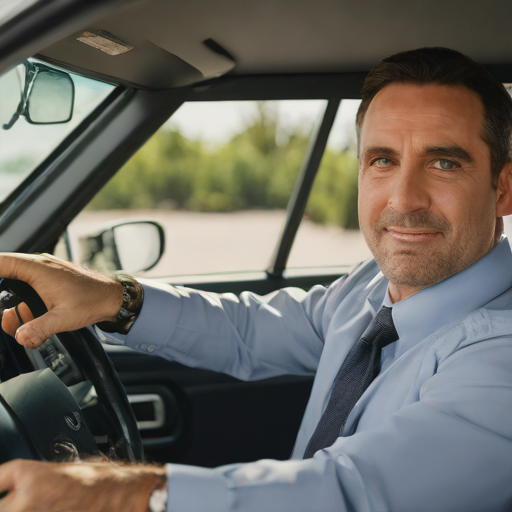

In [107]:
%%time

prompt = """
Michael G Scott (from the TV show The Office) inside his car, driving and smiling.
centered, looking into the camera, symmetrical body, symmetrical face, symmetrical eyes,
natural light photo, Canon 85L f4.8, ISO320, 5000K colour balance
""".strip()

generate_image(prompt, inference_steps=2)

The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['production']
The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['production']


  0%|          | 0/2 [00:00<?, ?it/s]

CPU times: user 813 ms, sys: 33 ms, total: 846 ms
Wall time: 851 ms


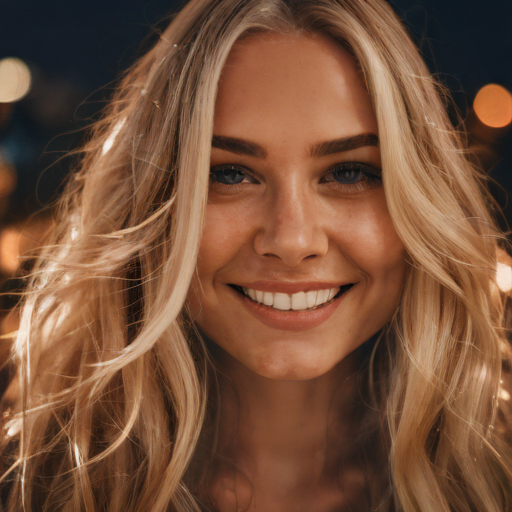

In [65]:
%%time

prompt = """
a smiling beautiful woman with long blonde hair and glossy eyes surrounded by glowing fire sparks at night,
symmetrical body, symmetrical face, symmetrical eyes,
magical light fog, deep focus+closeup, hyper-realistic,
volumetric lighting, dramatic lighting, beautiful composition,
intricate details, instagram, trending, photograph, film grain and noise, 8K,
cinematic, post-production
""".strip()

generate_image(prompt, inference_steps=2)

## Misc

  0%|          | 0/2 [00:00<?, ?it/s]

CPU times: user 826 ms, sys: 38.4 ms, total: 864 ms
Wall time: 905 ms


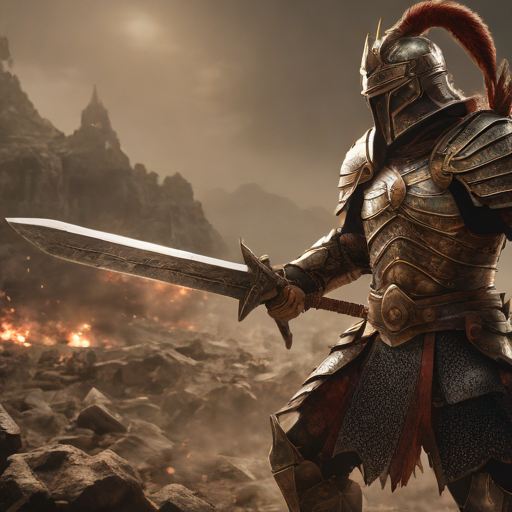

In [69]:
%%time

prompt = """
A vividly detailed digital artwork depicting a warrior in dramatic battle stance,
clad in unique armor and wielding a distinctive weapon,
set against an intense backdrop.
dramatic lighting, cinematic, post-production
""".strip()

generate_image(prompt, inference_steps=2)

  0%|          | 0/4 [00:00<?, ?it/s]

CPU times: user 1.03 s, sys: 79 ms, total: 1.11 s
Wall time: 1.12 s


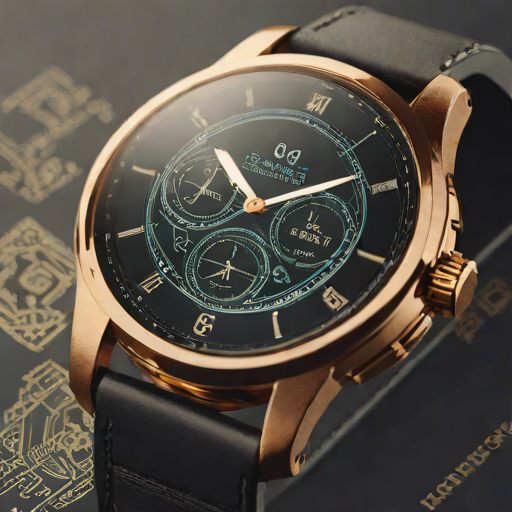

In [80]:
%%time

prompt = """
A concept image of a vintage-inspired smartwatch with a futuristic twist,
featuring a holographic display,
combining elements of classic elegance and advanced technology.
intricate details, instagram, trending, photograph, film grain and noise, 8K
""".strip()

generate_image(prompt, inference_steps=4)

## Negative Prompts

  0%|          | 0/2 [00:00<?, ?it/s]

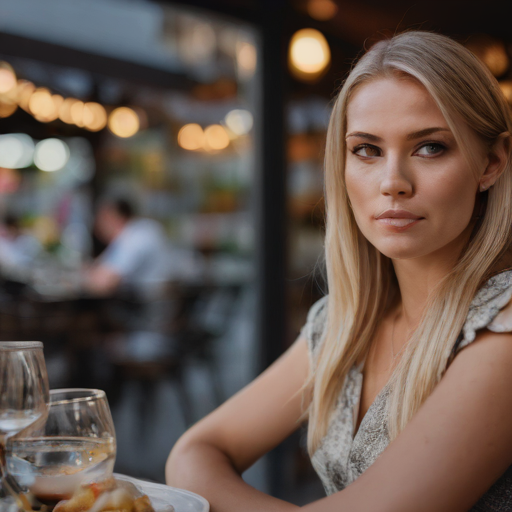

In [22]:
generator = torch.Generator(device="cuda").manual_seed(42)

prompt = """
An ultra-quality photograph of a young woman with highlighted hair, sitting outside a restaurant.
She wears a dress, with studio and rim lighting enhancing her features.
She looks directly at the camera, capturing a sharp focus, tack sharp details, and depth of field.
Fujifilm XT3. Her eyes are glossy and highly detailed, with skin showing clear pores
""".strip()

negative_prompt = """
disfigured, ugly, bad, immature, cartoon, anime, 3d, painting, b&w
""".strip()

image_generator(
    prompt=prompt,
    negative_prompt=negative_prompt,
    num_inference_steps=2,
    guidance_scale=0.0,
    generator=generator,
).images[0]